Deep cleaning for the reviews, eliminate all the duplicated review

In [2]:
import json
import Ipy_importer
import re
import numpy as np
from itertools import chain

In [3]:
'''
This section got the new attribute lexcicon
'''
with open("H:/Data/new_new_attribute_lexicon.json", "r") as f:
    attribute_lexicon = json.load(f)
    print(type(attribute_lexicon))
    attribute_lexicon['Permeability']

    
temp1 = []
for k, v in attribute_lexicon.items():
    v = sorted(set(v),key=v.index)
    temp2 = []
    for j in v:
        if j not in temp1: 
            temp2.append(j)
#     print(temp2)
        temp1.append(j)
    attribute_lexicon[k] = temp2
# temp = []
# for v in attribute_lexicon.values():
#     for i  in v:
#         temp.append(i)
# attribute_lexicon = temp
# this is the new attribute lexicon got from ramin

<class 'dict'>


In [4]:
'''
This is a test for the cleaning of attribute lexicon, IMPORTANT: This section goes wrong then the function is right, if it goes well then you need test the previous function

'''
print(attribute_lexicon['Shape'].index('style'))
# print(attribute_lexicon['Fit'].index('style'))
# print(attribute_lexicon['Fit'])

49


In [5]:
print(attribute_lexicon.keys())
# print(list(chain(*list(attribute_lexicon.values()))))

dict_keys(['Permeability', 'Impact_absorption', 'Energy_Return', 'Stability', 'Flexibility', 'Traction', 'Durability', 'Cushion', 'Outsole', 'Midsole', 'Insole', 'Heel', 'Color', 'Shape', 'Upper', 'Fit', 'Weight', 'Fixation', 'Toe_Box', 'Collar', 'Fasteners', 'Achile_notch', 'Tongue'])


workflow:
1. pick the windows and save it in a split file
2. identify the sentiment word in each window

In [6]:
'''This setion is testing id the creating POS code works'''
from Create_POS import create_POS_file
review_dic = create_POS_file.create_new_POS("H:/Data/clean_review.txt")

# temp_tag = []
# with open("H:/Data/review_POS.txt","r", encoding = "UTF-8-sig") as f:
#     file = f.readlines()
#     for i in file:
#         i = i.strip("][\n").split(" ")
#         temp_tag.append(i)
'''
this section change the review dictionary to the POS file
'''
i = 0
for k,v in review_dic.items():
    i += 1
    if i == 3:
#         print(k, v)
        pass


importing Jupyter notebook from Create_POS.ipynb


In [7]:
# print(review_dic['Reebok_Classic_Leather_Gum_Casual_Shoes'][0].split(":")[1].split(","))
# print(len(review_dic['Reebok_Classic_Leather_Gum_Casual_Shoes'][0].split(":")[1].split(",")))
# print(type(review_dic['Reebok_Classic_Leather_Gum_Casual_Shoes'][0].split(":")[1].split(",")))
# # print(review_dic['Nike_Air_Huarache_Run_Casual_Shoes'])

In [8]:
'''
This function is for the filtering of reviews that pick those only one attribute review can be a whole window
also note that all the functions displayed below are treating dictionaries as an object
'''
def pick_unique_window(data):
    for k, v in data.items():
        temp1 = []
        for review in v:
            i = 0
            j = review.split(":")[1]
            j = j.split(",")
            for pair in j:
                word = pair.split("+")[0]
                word = word.strip("]'[")
                if word in list(chain(*list(attribute_lexicon.values()))):
                    i += 1
            if i == 1:
                review = review + "ONLY1"
            temp1.append(review)
        data[k] = temp1 
    return data
                            

In [9]:
review_dic  = pick_unique_window(review_dic)
# review_dic['Nike_Air_Huarache_Run_Casual_Shoes']

In [10]:
'''
This section I decide to extract all the old dictionary
'''
sec_dic = {}
for k, v in review_dic.items():
    for review in v:
        title = review.split(":")[0]
        neirong = review.split(":")[1]
        if title not in sec_dic:
            sec_dic[title] = neirong
        else:
            sec_dic[title].append(neirong)

In [11]:
def look_3 (dic):
    i = 0
    for k, v in dic.items():
        i += 1
        if i <= 4:
            print(k, v)

In [12]:
# look_3(sec_dic)

In [13]:
'''
This function is extracting all the windows for a single product
based on the modification of the algorithm 1, 
43th time version
'''
def creat_window(file_name):
    window = 5
#     Iterating through all POS tags
#     for k, v in file_name.items():
    for k, review in file_name.items():
#         print(review)
        if 'ONLY1' in review:
            n_window = review.split("ONLY")[0]
            file_name[k] = n_window
        else:
            review = review.strip('] [')
            pairs = review.split(",")
            t = 0
            tmp = []
            for element in pairs:
                l = len(pairs)
                        # joining the terms with ,
        #                 element = ",".join(element)
                word = element.strip("][(\'").split('+')[0]
                word = word.strip(" '")
                if word in list(chain(*list(attribute_lexicon.values()))):
                    pairs[t] = pairs[t] + "attr"
                    if t >= 5 and t <= l-5:
                        nn_window = pairs[t-5:t+6]
                    if t >= 5 and t > l-5:
                        nn_window = pairs[t-5:]
                    if t < 5 and t <= l-5:
                        nn_window = pairs[0:t+6]
                    if t < 5 and t > l-5:
                        nn_window = pairs[0:]
                    tmp.append(nn_window)
                    pairs[t] = pairs[t].split("attr")[0]
#                     print(tmp)
                t += 1

            file_name[k] = tmp
#         break
    return file_name

def write_window(file_name):
    with open(file_name, 'w', encoding = 'UTF-8') as f:
        for i in output:
            f.write(str(i))
            f.write('\n')

In [14]:
sec_dic = creat_window(sec_dic)

In [15]:
# look_3(sec_dic)

In [16]:
def locate_attribute(data):
    for k,v in data.items():
        temp1 = []
        # this is the list to store the description for the attribute appears in the window
        for window in v:
            temp2 = []
            for j in window:
#                 n_word = n_j.strip("(\'").split("+")[0].strip("\'")
#                 n_word = n_word.strip(" \'")
                # pick the word first and find the closest pre-defined tag
                if 'attr' in j:
                    word_p = window.index(j)
                    # word_p shows the position of attribute appears in the sentence   
                    j = str(j) + str(word_p)
                temp2.append(j)
            temp1.append(temp2)
        data[k] = temp1
    return data

            

In [17]:
'''
This section already locate the attribute position and itself in the window
'''
sec_dic = locate_attribute(sec_dic)

In [18]:
def locate_description(data):
    for k,v in data.items():
        temp1 = []
        for window in v:
            temp2 = []
            for j in window:
                n_j = ''.join(j)
                n_tag = n_j.strip(")(\'").split("+")[-1].lstrip(" \'")
                    # n_tag is the tag list of the pairs inside the window except the attribute word
                if n_tag in ['NN', 'NNS', 'JJ', 'RB']:
                    tag_p = window.index(j)
                    j = str(j) + "decr" + str(tag_p)
                temp2.append(j)
            temp1.append(temp2)
        data[k] = temp1
    return data     

In [19]:
sec_dic = locate_description(sec_dic)

In [20]:
def write_json(file_name, dic):
    with open(file_name, "w") as f:
        json.dump(dic, f)
        print("Done")
    

In [21]:
write_json("H:Data/7202019早上_des_attr.json", sec_dic)

Done


In [22]:
def write_file(file_name, data_set):
    with open(file_name, "w", encoding = "UTF-8") as f:
        for i in data_set:
            f.write(str(i))
            f.write('\n')
        print('Done')
def write_txt_fromdic(file_name, data):
    with open(file_name, "w", encoding = "UTF-8") as f:
        for k, v in data.items():
            f.write(str(k) + str(v))
            f.write('\n')
            f.write('\n')
        print('Done')

In [23]:
baoli_lexicon = []
with open("H:/Google_download/opinion-lexicon-English/positive-words.txt") as f:
    positive = f.readlines()
    positive = "".join(positive).split('\n')
    positive = positive[30:]
with open("H:/Google_download/opinion-lexicon-English/negative-words.txt") as n_f:
    negative = n_f.readlines()
    negative = "".join(negative).split('\n')
baoli_lexicon = positive + negative

In [24]:
sentiment_lexicon = {}
for i in range(0,len(baoli_lexicon)):
    sentiment_lexicon[i] = baoli_lexicon[i] 

In [25]:
l_sentiment = list(sentiment_lexicon.values())

In [26]:
def locate_sentiment(data):
    for k,v  in data.items():
        temp1 = []
        for window in v:
            temp2 = []
            for j in window:
                n_j = str(j)
                n_senti = n_j.strip("(\'").split("+")[0].strip("\'")
                n_senti = n_senti.strip(" \'")
                if n_senti in l_sentiment:
                    senti_p = window.index(j)
                    # word_p shows the position of attribute appears in the sentence   
                    j = str(j) + "senti" + str(senti_p)
                temp2.append(j)
            temp1.append(temp2)
        data[k] = temp1
    return data


In [27]:
sec_dic = locate_sentiment(sec_dic)

In [28]:
write_json("H:/Data/7202019threeresults.json", review_dic)

Done


In [29]:
def to_results(data):
    for k, v in data.items():
        temp1 = []
        for window in v:
            temp2 = []
            for j in window:
                if 'attr' in str(j) or 'senti' in str(j) or 'decr' in str(j):
                    temp2.append(j)
            temp1.append(temp2)
        data[k] = temp1
    return data


In [30]:
sec_dic = to_results(sec_dic)

In [ ]:
# look_3(sec_dic)

In [ ]:
write_json("H:/Data/7202019_results.json", sec_dic)

In [ ]:
write_txt_fromdic("H:/Data/7202019_results.txt", review_dic)

## Build sentiment lexicon 

In [ ]:
import senticnet

In [ ]:
from senticnet.senticnet import SenticNet

sn = SenticNet()
# concept_info = sn.concept('love')
polarity_value = sn.polarity_value('vicious')
polarity_intense = sn.polarity_intense('vicious')
# moodtags = sn.moodtags('love')
# semantics = sn.semantics('love')
# sentics = sn.sentics('love')

In [ ]:
print(polarity_value, polarity_intense)

In [153]:
sentiment_lexicon

{0: 'a+',
 1: 'abound',
 2: 'abounds',
 3: 'abundance',
 4: 'abundant',
 5: 'accessable',
 6: 'accessible',
 7: 'acclaim',
 8: 'acclaimed',
 9: 'acclamation',
 10: 'accolade',
 11: 'accolades',
 12: 'accommodative',
 13: 'accomodative',
 14: 'accomplish',
 15: 'accomplished',
 16: 'accomplishment',
 17: 'accomplishments',
 18: 'accurate',
 19: 'accurately',
 20: 'achievable',
 21: 'achievement',
 22: 'achievements',
 23: 'achievible',
 24: 'acumen',
 25: 'adaptable',
 26: 'adaptive',
 27: 'adequate',
 28: 'adjustable',
 29: 'admirable',
 30: 'admirably',
 31: 'admiration',
 32: 'admire',
 33: 'admirer',
 34: 'admiring',
 35: 'admiringly',
 36: 'adorable',
 37: 'adore',
 38: 'adored',
 39: 'adorer',
 40: 'adoring',
 41: 'adoringly',
 42: 'adroit',
 43: 'adroitly',
 44: 'adulate',
 45: 'adulation',
 46: 'adulatory',
 47: 'advanced',
 48: 'advantage',
 49: 'advantageous',
 50: 'advantageously',
 51: 'advantages',
 52: 'adventuresome',
 53: 'adventurous',
 54: 'advocate',
 55: 'advocated',

In [38]:
# manu = np.load("H:/Data/jade.npy")
# print(manu)

In [39]:
# with open("H:/Data/manu.txt", "w") as f:
#     for i in manu:
#         i = "".join(str(i))
#         f.write(i)
#         f.write('\n')

In [40]:
# # this is the old lexicon created by myself
# # not used in the followind algorithm
# attribute_lexicon = ['nike', 'addidas', 'puma', 'reebok', 'under armour', 'asics', 'brooks', 'champion', 'converse', 'jordan', 'fila', 'lacoste', 'mizuno', 'new balance', 'snkr', 'skechers', 'timberland', 'saucony', 'k-swiss', 'air', 'design', 'color', 'combination', 'sensor', 'surface', 'midsole', 'durable', 'explosive', 'speedy', 'powerful', 'intelligent', 'eyelet', 'heel', 'heel cup', 'quarter', 'sole', 'toe cap', 'tongue', 'topline', 'top piece', 'upper', 'vamp', 'welt', 'collar', 'foxing', 'heel counter', 'heel tab', 'inner sole', 'lace guard', 'midsole', 'outsole', 'padding', 'sock liner', 'aglets', 'beaters', 'bespoke', 'colorway', 'deadstock', 'deubré', 'flip-flop', 'grails', 'high top', 'hypebeast', 'hyperstrike', 'jumpman', 'lows', 'mids', 'nib', 'ndc', 'ogs', 'on ice', 'player edition', 'player exclusives', 'quickstrike', 'reseller', 'Retro', 'tonal', 'upper', 'updown', 'vnds', 'zigtech', 'red', 'yellow', 'blue', 'leather', 'thick', 'light', 'heavy', 'hard', 'soft', 'materials', 'big', 'small', 'adjustable', 'adorable', 'anatomic', 'anatomically designed', 'anti-fatigue', 'antimicrobial', 'athletic', 'beveled', 'bold', 'boys', 'breathable', 'breezy', 'canvas', 'casual', 'chic', 'classic', 'closed-toe', 'comfortable', 'comfy', 'contemporary', 'cooler', 'cushioned', 'cut-out', 'cute', 'cutting-edge', 'dainty', 'dapper', 'decorative', 'dependable', 'designer', 'detailed', 'distressed', 'dress', 'drier', 'kids', 'latest', 'lightweight', 'long-lasting', 'machine washable', 'masculine', 'memory foam-lined', 'mens', 'moisture-wicking', 'non-marking', 'non-slip', 'odor-absorbing', 'odor-resistant', 'open-toe', 'optimal', 'over-the-knee', 'overlay', 'padded', 'patchwork', 'patent', 'pleated', 'plush', 'professional', 'protective', 'pull-on', 'reflective', 'reliable', 'remodeled', 'revolutionary', 'rocker-style', 'ruched', 'rugged', 'sassy', 'savvy', 'easy-to-maintain', 'eco-friendly', 'edgy', 'efficient', 'elegant', 'embroidered', 'engineered', 'environmentally-friendly', 'ergonomic', 'everyday', 'exceptional', 'exciting', 'fabric-lined', 'fancy', 'fashionable', 'favorite', 'feminine', 'finely detailed', 'flattering', 'flexible', 'flirty', 'foot-friendly', 'forefoot', 'form-fitting', 'girls', 'gusseted', 'high-heeled', 'high-performance', 'hot', 'imported', 'injection-molded', 'innovative', 'insole', 'insulated', 'shock-absorbent', 'shock-absorbing', 'simple', 'sleek', 'slip-on', 'slip-resistant', 'slouched', 'smooth', 'sophisticated', 'stable', 'state-of-the-art', 'strapless', 'strappy', 'structural', 'stunning', 'stylish', 'suede', 'superior', 'supple', 'supportive', 'synthetic', 'textured', 'toning', 'top-of-the-line', 'treaded', 'trendy', 'underfoot', 'unique', 'versatile', 'water-resistant', 'waterproof', 'wear-anywhere', 'womens', 'eva insert', 'accent', 'accents', 'all-day comfort', 'ankle', 'ankle strap', 'apparel', 'arch', 'arch bridge', 'arch support', 'best fit', 'beveled heel', 'block heel', 'brand', 'breathability', 'buckle', 'calf', 'calf space', 'canvas', 'clasp', 'closure', 'comfort', 'coziness', 'cushioning', 'cut-out upper', 'design', 'design elements', 'detailing', 'durability', 'easy on/off', 'efficiency', 'elastic', 'embellishment', 'mesh fabric', 'midsole', 'motion control', 'movement', 'name brand', 'nubuck', 'orthotics', 'outdoor wear', 'outsole', 'over-pronator', 'padding', 'padding', 'pair', 'pair of shoes', 'panel', 'patent leather', 'peep toe', 'perfect fit', 'personal style', 'platform', 'pointed toe', 'posture', 'propulsion', 'quality', 'rearfoot', 'rearfoot stability', 'removable insole', 'rocker bottom', 'sandal', 'season', 'shearling', 'shock', 'shoe', 'ensemble', 'fabric', 'fall', 'fashion', 'fit', 'flair', 'foot', 'foot environment', 'footbed', 'footing', 'full-grain leather', 'gait', 'give', 'grip', 'heel', 'heel cup', 'heel strike', 'hidden zipper', 'impact', 'indoor wear', 'innovation', 'insert', 'insole', 'instep', 'laces', 'leather', 'leather upper', 'leg', 'lifestyle', 'lining', 'lining', 'low back', 'side zip entry', 'skid-resistant', 'sole', 'spring', 'square toe', 'stability', 'steel shank', 'steel toe', 'stitching', 'strap', 'strap closure', 'stride', 'strike points', 'style', 'styling', 'summer', 'support', 'technology', 'toe-off', 'toes', 'tongue', 'traction', 'tread', 'tricot lining', 'trim', 'underfoot protection', 'upper', 'ventilation system', 'wardrobe', 'warmth', 'width', 'winter', 'zipper']
# import Create_POS
# Create_POS.create_POS_file.write_file("H:/Data/old_attribute_lexicon.txt", attribute_lexicon)

## Import word2vec and start turn the description into embedding

In [31]:
import tensorflow as tf
import keras 
import sys
import os
import gensim
import sklearn
import nltk

Using TensorFlow backend.
K:\Anaconda\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [32]:
model = gensim.models.KeyedVectors.load_word2vec_format('H:/models/GoogleNews-vectors-negative300.bin',binary=True)

K:\Anaconda\lib\site-packages\smart_open\smart_open_lib.py:398: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


In [33]:
pre_word = model.vocab.keys()

In [34]:
# look_3(sec_dic)

In [35]:
def get_key (dic, value):
#     for k, v in dic
     return [k for k, v in dic.items() if value in v]

In [36]:
get_key(attribute_lexicon, 'weight' )

['Weight']

In [37]:
'''
This function is aiming at deal with those window that includes multiple tags
After adjusting the create_window function, this function is unnecessary
'''
def clean_window(dic):
    for k, v in dic.items():
        for window in v:
            a = 0
            for word in window:
                # 9th version
                # This loop clean those words with multiple tags, mainly are senti with attr and senti with decr
#                 if 'attr' in word and 'senti' in word:
#                     window[a] = word.split("senti")[0]
#                 if 'decr' in word and 'senti' in word:
#                     window[a] = word.split("senti")[0]
                if 'attr' in word and 'senti' in word:
                    window[a] = word.split("senti")[0]
                a += 1
    return dic


In [38]:
sec_dic = clean_window(sec_dic)

In [39]:
# look_3(sec_dic)

In [40]:
# ceshi = {'Reebok_Classic_Leather_Gum_Casual_Shoes0': [[" 'love+VBP'senti1", " 'old+JJ'decr3", " 'school+NN'decr4", " 'style+NN'attr5", " 'sneakers+NNS'decr8", " 'so+RB'decr10"], [" 'sneakers+NNS'decr2", " 'so+RB'decr4", " 'comfortable+JJ'attr5"]],
# 'Reebok_Classic_Leather_Gum_Casual_Shoes1': [[" 'true+JJ'decr1", " 'classic+NN'attr2", " 'fans+NNS'decr5senti5", " 'sneakers+NNS'decr7"], [" 'nice+RB'decr1senti1", " 'materials+NNS'attr5", " 'pretty+RB'decr7senti7", " 'good+JJ'decr8senti8", " 'too+RB'decr9"]],
# 'Reebok_Classic_Leather_Gum_Casual_Shoes2': [[" 'kid+NN'decr1", " 'so+RB'decr2", " 'always+RB'decr4", " 'like+IN'attr5", " 'retro+NN'decr7", " 'sneakers+NNS'decr9"], [" 'so+RB'decr0", " 'always+RB'decr2", " 'like+IN'senti3", " 'retro+NN'attr5", " 'sneakers+NNS'decr7"]],
# 'Lacoste_Chaymon_Casual_Shoes0': [[" 'shoe+NN'decr2", " 'causal+NN'decr4", " 'wear+NN'attr5", " 'kaki+NN'decr8"], [" 'wear+NN'decr0", " 'kaki+NN'decr3", " 'feel+VBZ'attr5", " 'great+JJ'decr6senti6", " 'so+RB'decr7", " 'comfortable+JJ'decr8senti8", " 'light+JJ'decr9", " 'weight+NN'decr10"], [" 'kaki+NN'decr0", " 'great+JJ'decr3senti3", " 'so+RB'decr4", " 'comfortable+JJ'attr5", " 'light+JJ'decr6", " 'weight+NN'decr7", " 'stylish+NN'decr8senti8", " 'i+NN'decr10"], [" 'great+JJ'decr2senti2", " 'so+RB'decr3", " 'comfortable+JJ'decr4senti4", " 'light+JJ'attr5", " 'weight+NN'decr6", " 'stylish+NN'decr7senti7", " 'i+NN'decr9"], [" 'great+JJ'decr1senti1", " 'so+RB'decr2", " 'comfortable+JJ'decr3senti3", " 'light+JJ'decr4", " 'weight+NN'attr5", " 'stylish+NN'decr6senti6", " 'i+NN'decr8", " 'alot+NN'decr10"]]}

In [41]:
'''
The first test shows that the attribute lexicon includes tromedous duplicate attributes
'''
# 8th version
def find_title (dic):
    for k, v in dic.items():
        temp = []
        for window in v:
            for word in window:
                in_dic = {}
                if 'attr' in word:
                    title = word.split("+")[0].strip(" \'")
                    title = get_key(attribute_lexicon, title)
                    title = ''.join(title)
                    window.remove(word)
                    in_dic[title] = window
                    temp.append(in_dic)
        dic[k] = temp
    return dic

In [42]:
sec_dic = find_title(sec_dic)

In [43]:
look_3(sec_dic)

Reebok_Classic_Leather_Gum_Casual_Shoes0 [{'Shape': [" 'love+VBP'senti1", " 'old+JJ'decr3", " 'school+NN'decr4", " 'sneakers+NNS'decr8", " 'so+RB'decr10"]}, {'Fit': [" 'sneakers+NNS'decr2", " 'so+RB'decr4"]}]
Reebok_Classic_Leather_Gum_Casual_Shoes1 [{'Cushion': [" 'true+JJ'decr1", " 'fans+NNS'decr5senti5", " 'sneakers+NNS'decr7"]}, {'Heel': [" 'nice+RB'decr1senti1", " 'pretty+RB'decr7senti7", " 'good+JJ'decr8senti8", " 'too+RB'decr9"]}]
Reebok_Classic_Leather_Gum_Casual_Shoes2 [{'Shape': [" 'kid+NN'decr1", " 'so+RB'decr2", " 'always+RB'decr4", " 'retro+NN'decr7", " 'sneakers+NNS'decr9"]}, {'Fixation': [" 'so+RB'decr0", " 'always+RB'decr2", " 'like+IN'senti3", " 'sneakers+NNS'decr7"]}]
Lacoste_Chaymon_Casual_Shoes0 [{'Fasteners': [" 'shoe+NN'decr2", " 'causal+NN'decr4", " 'kaki+NN'decr8"]}, {'Fit': [" 'wear+NN'decr0", " 'kaki+NN'decr3", " 'great+JJ'decr6senti6", " 'so+RB'decr7", " 'comfortable+JJ'decr8senti8", " 'light+JJ'decr9", " 'weight+NN'decr10"]}, {'Fit': [" 'kaki+NN'decr0", " 'g

In [44]:
'''
This section is recreating the positive lexicon and negtive lexicon
'''
print(len(positive), len(negative))


2007 4784


In [45]:
# ceshi = {
# 'Reebok_Classic_Leather_Gum_Casual_Shoes0' : [{'Shape': [" 'love+VBP'senti1", " 'old+JJ'decr3", " 'school+NN'decr4", " 'sneakers+NNS'decr8", " 'so+RB'decr10"]}, {'Fit': [" 'sneakers+NNS'decr2", " 'so+RB'decr4"]}],
# 'Reebok_Classic_Leather_Gum_Casual_Shoes1' : [{'Cushion': [" 'true+JJ'decr1", " 'fans+NNS'decr5senti5", " 'sneakers+NNS'decr7"]}, {'Heel': [" 'nice+RB'decr1senti1", " 'pretty+RB'decr7senti7", " 'good+JJ'decr8senti8", " 'too+RB'decr9"]}],
# 'Reebok_Classic_Leather_Gum_Casual_Shoes2' : [{'Shape': [" 'kid+NN'decr1", " 'so+RB'decr2", " 'always+RB'decr4", " 'retro+NN'decr7", " 'sneakers+NNS'decr9"]}, {'Fixation': [" 'so+RB'decr0", " 'always+RB'decr2", " 'like+IN'senti3", " 'sneakers+NNS'decr7"]}],
# 'Lacoste_Chaymon_Casual_Shoes0' : [{'Fasteners': [" 'shoe+NN'decr2", " 'causal+NN'decr4", " 'kaki+NN'decr8"]}, {'Fit': [" 'wear+NN'decr0", " 'kaki+NN'decr3", " 'great+JJ'decr6senti6", " 'so+RB'decr7", " 'comfortable+JJ'decr8senti8", " 'light+JJ'decr9", " 'weight+NN'decr10"]}, {'Fit': [" 'kaki+NN'decr0", " 'great+JJ'decr3senti3", " 'so+RB'decr4", " 'light+JJ'decr6", " 'weight+NN'decr7", " 'stylish+NN'decr8senti8", " 'i+NN'decr10"]}, {'Heel': [" 'great+JJ'decr2senti2", " 'so+RB'decr3", " 'comfortable+JJ'decr4senti4", " 'weight+NN'decr6", " 'stylish+NN'decr7senti7", " 'i+NN'decr9"]}, {'Weight': [" 'great+JJ'decr1senti1", " 'so+RB'decr2", " 'comfortable+JJ'decr3senti3", " 'light+JJ'decr4", " 'stylish+NN'decr6senti6", " 'i+NN'decr8", " 'alot+NN'decr10"]}]
# }

# IMPORTANT: 7/19/2019 because the stage1 result is showing two large clusters, so we decide to eliminate the negetaive weights for every customer, in the following section I changed it, if wwant it back need to change it to -1

In [56]:
# def add_polarity(data):
#     for k, v in data.items():
#         for dic in v:
#             for sec_k, review in dic.items():
#                 pola = []
#                 for word in review:
#                     if 'senti' in word:
#                         word = word.split("+")[0].strip(" \'")
#                         if word in positive:
#                             pola.append(1)
#                         elif word in negative:
#                             pola.append(1)
#                 dic[sec_k].append(str(np.mean(pola)))
#     return data
        

## 7202019 the elimination of negative didn't seem to have influence for the results, I decide use the senticnet instead of use 1 to do the sentiment quatification

In [46]:
def add_polarity(data):
    for k, v in data.items():
        for dic in v:
            for sec_k, review in dic.items():
                pola = []
                for word in review:
                    if 'senti' in word:
                        word = word.split("+")[0].strip(" \'")
                        try:
                            pola.append(sn.polarity_intense(word))
                        except:
                            pass
                dic[sec_k].append(str(np.mean(pola)))
    return data

In [47]:
sec_dic = add_polarity(sec_dic)

K:\Anaconda\lib\site-packages\numpy\core\fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
K:\Anaconda\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [48]:
look_3(sec_dic)

Reebok_Classic_Leather_Gum_Casual_Shoes0 [{'Shape': [" 'love+VBP'senti1", " 'old+JJ'decr3", " 'school+NN'decr4", " 'sneakers+NNS'decr8", " 'so+RB'decr10", 'nan']}, {'Fit': [" 'sneakers+NNS'decr2", " 'so+RB'decr4", 'nan']}]
Reebok_Classic_Leather_Gum_Casual_Shoes1 [{'Cushion': [" 'true+JJ'decr1", " 'fans+NNS'decr5senti5", " 'sneakers+NNS'decr7", 'nan']}, {'Heel': [" 'nice+RB'decr1senti1", " 'pretty+RB'decr7senti7", " 'good+JJ'decr8senti8", " 'too+RB'decr9", 'nan']}]
Reebok_Classic_Leather_Gum_Casual_Shoes2 [{'Shape': [" 'kid+NN'decr1", " 'so+RB'decr2", " 'always+RB'decr4", " 'retro+NN'decr7", " 'sneakers+NNS'decr9", 'nan']}, {'Fixation': [" 'so+RB'decr0", " 'always+RB'decr2", " 'like+IN'senti3", " 'sneakers+NNS'decr7", 'nan']}]
Lacoste_Chaymon_Casual_Shoes0 [{'Fasteners': [" 'shoe+NN'decr2", " 'causal+NN'decr4", " 'kaki+NN'decr8", 'nan']}, {'Fit': [" 'wear+NN'decr0", " 'kaki+NN'decr3", " 'great+JJ'decr6senti6", " 'so+RB'decr7", " 'comfortable+JJ'decr8senti8", " 'light+JJ'decr9", " 'weig

In [49]:
'''
This function I set all the window doesn't include polarity to positive, assumption no opnion means positive
'''
def manu_pola (data):
    for k, v in data.items():
        for dic in v:
            for sec_k, review in dic.items():
                for word in review:
                    if word == 'nan':
                        review[-1] = str(1.0)
    return data

In [50]:
sec_dic = manu_pola(sec_dic)

In [51]:
look_3(sec_dic)

Reebok_Classic_Leather_Gum_Casual_Shoes0 [{'Shape': [" 'love+VBP'senti1", " 'old+JJ'decr3", " 'school+NN'decr4", " 'sneakers+NNS'decr8", " 'so+RB'decr10", '1.0']}, {'Fit': [" 'sneakers+NNS'decr2", " 'so+RB'decr4", '1.0']}]
Reebok_Classic_Leather_Gum_Casual_Shoes1 [{'Cushion': [" 'true+JJ'decr1", " 'fans+NNS'decr5senti5", " 'sneakers+NNS'decr7", '1.0']}, {'Heel': [" 'nice+RB'decr1senti1", " 'pretty+RB'decr7senti7", " 'good+JJ'decr8senti8", " 'too+RB'decr9", '1.0']}]
Reebok_Classic_Leather_Gum_Casual_Shoes2 [{'Shape': [" 'kid+NN'decr1", " 'so+RB'decr2", " 'always+RB'decr4", " 'retro+NN'decr7", " 'sneakers+NNS'decr9", '1.0']}, {'Fixation': [" 'so+RB'decr0", " 'always+RB'decr2", " 'like+IN'senti3", " 'sneakers+NNS'decr7", '1.0']}]
Lacoste_Chaymon_Casual_Shoes0 [{'Fasteners': [" 'shoe+NN'decr2", " 'causal+NN'decr4", " 'kaki+NN'decr8", '1.0']}, {'Fit': [" 'wear+NN'decr0", " 'kaki+NN'decr3", " 'great+JJ'decr6senti6", " 'so+RB'decr7", " 'comfortable+JJ'decr8senti8", " 'light+JJ'decr9", " 'weig

In [52]:
# ceshi = {
# 'Reebok_Classic_Leather_Gum_Casual_Shoes0': [{'Shape': [" 'love+VBP'senti1", " 'old+JJ'decr3", " 'school+NN'decr4", " 'sneakers+NNS'decr8", " 'so+RB'decr10", '1.0']}, {'Fit': [" 'sneakers+NNS'decr2", " 'so+RB'decr4", '1.0']}],
# 'Reebok_Classic_Leather_Gum_Casual_Shoes1': [{'Cushion': [" 'true+JJ'decr1", " 'fans+NNS'decr5senti5", " 'sneakers+NNS'decr7", '1.0']}, {'Heel': [" 'nice+RB'decr1senti1", " 'pretty+RB'decr7senti7", " 'good+JJ'decr8senti8", " 'too+RB'decr9", '1.0']}],
# 'Reebok_Classic_Leather_Gum_Casual_Shoes2': [{'Shape': [" 'kid+NN'decr1", " 'so+RB'decr2", " 'always+RB'decr4", " 'retro+NN'decr7", " 'sneakers+NNS'decr9", '1.0']}, {'Fixation': [" 'so+RB'decr0", " 'always+RB'decr2", " 'like+IN'senti3", " 'sneakers+NNS'decr7", '1.0']}],
# 'Lacoste_Chaymon_Casual_Shoes0': [{'Fasteners': [" 'shoe+NN'decr2", " 'causal+NN'decr4", " 'kaki+NN'decr8", '1.0']}, {'Fit': [" 'wear+NN'decr0", " 'kaki+NN'decr3", " 'great+JJ'decr6senti6", " 'so+RB'decr7", " 'comfortable+JJ'decr8senti8", " 'light+JJ'decr9", " 'weight+NN'decr10", '1.0']}, {'Fit': [" 'kaki+NN'decr0", " 'great+JJ'decr3senti3", " 'so+RB'decr4", " 'light+JJ'decr6", " 'weight+NN'decr7", " 'stylish+NN'decr8senti8", " 'i+NN'decr10", '1.0']}, {'Heel': [" 'great+JJ'decr2senti2", " 'so+RB'decr3", " 'comfortable+JJ'decr4senti4", " 'weight+NN'decr6", " 'stylish+NN'decr7senti7", " 'i+NN'decr9", '1.0']}, {'Weight': [" 'great+JJ'decr1senti1", " 'so+RB'decr2", " 'comfortable+JJ'decr3senti3", " 'light+JJ'decr4", " 'stylish+NN'decr6senti6", " 'i+NN'decr8", " 'alot+NN'decr10", '1.0']}]
# }

In [53]:
'''
This function is aiming at get the average embedding of each element in a window
'''
def get_avg_emb (data):
    for k,v in data.items():
        for dic in v:
            window_avg = []
            for sec_k, review in dic.items():
                avg_emb = []
                for word in review:
                    if 'decr' in word:
                        word = word.split("+")[0].strip(" \'")
                        if word not in pre_word:
                            continue
                        vec = model[word]
                        avg_emb.append(vec)
                window_avg.append(np.mean(avg_emb, axis = 0) * float(review[-1]))
                dic[sec_k] = window_avg
    return data

In [54]:
sec_dic = get_avg_emb(sec_dic)

In [55]:
# look_3(sec_dic)

In [56]:
'''
creating a new test dictionary
'''
# ceshi = {}
# i = 0
# for k,v in sec_dic.items():
#     if i <= 15:
#         if k not in ceshi:
#             ceshi[k] = v
#     i += 1
            

'\ncreating a new test dictionary\n'

In [57]:
import copy

In [58]:
def look_3key(data):
    i = 0
    for k, v in data.items():
        i += 1
        if i <= 4:
            for dic in v:
                print(dic.keys())
                
def look_5key(data):
    i = 0
    for k, v in data.items():
        i += 1
        if i <= 6:
            for dic in v:
                print(dic.keys())

                
def look_15key(data):
    i = 0
    for k, v in data.items():
        i += 1
        if i <= 15:
            for dic in v:
                print(dic.keys())

In [59]:
# ceshi2 = copy.deepcopy(ceshi)

In [60]:
# look_5key(ceshi2)

In [61]:
def clean_nan(data):
    for key in list(data.keys()):
        if not data.get(key):
            del data[key]
    for k, v in data.items():
        for dic in v:
            for key in list(dic.keys()):
                if not dic.get(key):
                    del dic[key]
    return data

In [62]:
sec_dic = clean_nan(sec_dic)

In [63]:
'''
creating a new test dictionary
# '''
# ceshi = {}
# i = 0
# for k,v in sec_dic.items():
#     if i <= 15:
#         if k not in ceshi:
#             ceshi[k] = v
#     i += 1
            

'\ncreating a new test dictionary\n# '

In [64]:
# ceshi2 = copy.deepcopy(ceshi)

In [65]:
# ceshi2['Nike_Shox_Nz_Running_Shoes3']

In [66]:
'''
There is another problem be observed in the previous results, some window indeed include mutiple attributes bute they may belongs to the same category, so in the lactote shoe, there are two fit in it
, Just get the average of two attributes if they belong to a same big category
'''

def clean_array(data):
    for k, v in data.items():
        rp = []
        i = 0
        kong = {}
        tmp2 = []
        for dic in v:
            rp.append(dic)
            for sec_k, sec_v in dic.items():
                kong[sec_k] = sec_v
                if sec_k in tmp2:
                    m = tmp2.index(sec_k)
                    kong[sec_k] = np.mean([kong[sec_k], v[i][sec_k][0]])
                    rp.pop(m)
#                     print(i)
                    try:
                        rp.pop(i-1)
                    except:
                        continue
                    rp.append(kong)
                    tmp2.remove(sec_k)
                else:
                    tmp2.append(sec_k)
                    del kong[sec_k]
            i += 1
            data[k] = rp
                
    return data


In [67]:
sec_dic = clean_array(sec_dic)

In [68]:
# look_15key(sec_dic)

In [69]:
def clean_again(data):
    for k,v in data.items():
        i = 0
        for dic in v:
            if dic == {}:
                v = v.pop(i)
            i += 1
    return data

In [70]:
sec_dic = clean_again(sec_dic)

In [71]:
look_3(sec_dic)

Reebok_Classic_Leather_Gum_Casual_Shoes0 [{'Shape': [array([ 5.32226562e-02,  8.57543945e-03,  4.17327881e-03,  9.25292969e-02,
       -2.11181641e-02,  3.50341797e-02,  9.09423828e-02, -9.50317383e-02,
        7.39059448e-02,  2.85339355e-02,  8.23974609e-02, -3.84216309e-02,
        7.91168213e-02,  1.96838379e-02, -1.20361328e-01,  7.37304688e-02,
        1.28173828e-03,  1.09237671e-01,  5.73120117e-02,  7.62939453e-02,
        3.53393555e-02,  1.22344971e-01, -1.27105713e-02,  2.83813477e-02,
        2.08663940e-02, -1.52160645e-01, -1.13079071e-01,  9.83886719e-02,
        1.11663818e-01, -5.79223633e-02,  1.09344482e-01, -3.53240967e-03,
        7.41424561e-02,  3.71551514e-02, -9.37576294e-02, -1.11846924e-02,
        1.53320312e-01, -9.20715332e-02, -1.82800293e-02,  9.34143066e-02,
        3.57360840e-02,  3.60412598e-02,  1.14562988e-01, -8.32519531e-02,
        7.43103027e-02,  3.83300781e-02,  5.57250977e-02,  7.46681690e-02,
       -6.13403320e-02,  1.00708008e-01,  3.662

In [72]:
# import json
# type(sec_dic)
# with open("H:/Data/matrix_of_everycustomer.json", "w") as f:
#     for k, v in sec_dic.items():
#         sec_dic[k] = str(v)
#     json.dump(sec_dic, f)
#     print('Done')
# cosine_similarity([test['Reebok_Classic_Leather_Gum_Casual_Shoes1'][0]['Cushion'][0],test['Lacoste_Chaymon_Casual_Shoes0'][1]['Fit'][0]])

In [73]:
ceshi = {}
i = 0
for k,v in sec_dic.items():
    if i <= 10:
        if k not in ceshi:
            ceshi[k] = v
    i += 1


In [74]:
ceshi
ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes0'][0]['Shape'][0]

array([ 5.32226562e-02,  8.57543945e-03,  4.17327881e-03,  9.25292969e-02,
       -2.11181641e-02,  3.50341797e-02,  9.09423828e-02, -9.50317383e-02,
        7.39059448e-02,  2.85339355e-02,  8.23974609e-02, -3.84216309e-02,
        7.91168213e-02,  1.96838379e-02, -1.20361328e-01,  7.37304688e-02,
        1.28173828e-03,  1.09237671e-01,  5.73120117e-02,  7.62939453e-02,
        3.53393555e-02,  1.22344971e-01, -1.27105713e-02,  2.83813477e-02,
        2.08663940e-02, -1.52160645e-01, -1.13079071e-01,  9.83886719e-02,
        1.11663818e-01, -5.79223633e-02,  1.09344482e-01, -3.53240967e-03,
        7.41424561e-02,  3.71551514e-02, -9.37576294e-02, -1.11846924e-02,
        1.53320312e-01, -9.20715332e-02, -1.82800293e-02,  9.34143066e-02,
        3.57360840e-02,  3.60412598e-02,  1.14562988e-01, -8.32519531e-02,
        7.43103027e-02,  3.83300781e-02,  5.57250977e-02,  7.46681690e-02,
       -6.13403320e-02,  1.00708008e-01,  3.66210938e-04,  8.72802734e-02,
        1.79290771e-04, -

In [85]:
# caonima = cosine_similarity([ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes0'][0]['Shape'][0], ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes1'][0]['Cushion'][0]])
# print(caonima)
# a = np.square(np.mean(caonima))
# a

## Get the similarity of each customer and visualize them

In [75]:
import numba
from scipy import spatial
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

In [76]:
'''
This is the function to get the similarities of different customers
'''
# 9th version
def get_smil (data):
    laozi = []
    i = 0
    for k,v in data.items():
#         print(k)
        i += 1
        print(i)
        if i  == 1:
            new_data = copy.deepcopy(data)
        del new_data[k]
        niubi = {}
        for dic in v:
#             print(dic.keys())
            for s_k, s_v in new_data.items():
                goushi = []
                for s_dic in s_v:
                    for attr, array in dic.items():
                        if attr in s_dic.keys():
                            try:
                                similarity = np.square(cosine_similarity([dic[attr][0], s_dic[attr][0]])[0][1])
                            except:
                                pass
                            goushi.append(similarity)
                            niubi[k + "+" + s_k] = np.mean(goushi)
        if niubi:
            laozi.append(niubi)
        tmp = list(data.items())
        tmp = tmp[1:]
        data = dict(tmp)
#         break
    return laozi
            

In [77]:
'''
creating a new test dictionary
'''
ceshi = {}
i = 0
for k,v in sec_dic.items():
    if i <= 3:
        if k not in ceshi:
            ceshi[k] = v
    i += 1
         
ceshi2 = copy.deepcopy(ceshi)
# # print(ceshi2.keys())
# # look_3key(ceshi2)

In [78]:
# test2 = list(ceshi2.items()) 
# print(test2)
# ceshi3 = dict(test2)
# if ceshi3 == ceshi2:
#     print('yes')
test = get_smil(ceshi2)

1
2
3
4


In [128]:
jiba = get_smil(sec_dic)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [129]:
# print(jiba[0])
# caonima = {}
# for i in test:
#     caonima.update(i)
    
# caonima
len(jiba)

23399

In [130]:
'''
combine all the dictionary into one dic
'''
jiba2 = {}
for i in jiba:
    jiba2.update(i)

In [131]:
print(type(jiba))
print(len(jiba2))
print(type(jiba2))
print(jiba2['Reebok_Classic_Leather_Gum_Casual_Shoes0+Reebok_Classic_Leather_Gum_Casual_Shoes2'])

<class 'list'>
145618279
<class 'dict'>
0.53861135


In [132]:
for k, v in jiba2.items():
    jiba2[k] = v.tolist()
'''
Imprtant, in this step I turn the array to list,and remeber this is for the writing out file
'''

'\nImprtant, in this step I turn the array to list,and remeber this is for the writing out file\n'

In [133]:
import json
with open('H:/Data/similarity_7202019_wanshangpingfang.json', 'w') as f:
    json.dump(jiba2, f)
print('Done')

Done


In [96]:
del jiba

In [98]:
look_3(jiba2)

Reebok_Classic_Leather_Gum_Casual_Shoes0+Reebok_Classic_Leather_Gum_Casual_Shoes2 0.8669507503509521
Reebok_Classic_Leather_Gum_Casual_Shoes0+Nike_Shox_Nz_Running_Shoes3 0.752762496471405
Reebok_Classic_Leather_Gum_Casual_Shoes0+Nike_Shox_Nz_Running_Shoes5 0.609744668006897
Reebok_Classic_Leather_Gum_Casual_Shoes0+Nike_Shox_Nz_Running_Shoes10 0.6152743697166443


In [136]:
ugly= [[0]*23403 for i in range(23403)]
print(np.shape(ugly))

name_dict = {}
o = 0
for k, v in jiba2.items():
#     print(v)
    o += 1
    if o % 50000 == 0:
        print(o)
    n1,n2= k.split("+")
    if n1 not in name_dict:
        name_dict[n1] = len(name_dict)
    n1_id = name_dict[n1]
#     print(n1_id)
    if n2 not in name_dict:
        name_dict[n2] = len(name_dict)
    n2_id = name_dict[n2]
#     print(n1_id, n2_id)
    if n2_id > n1_id:
        ugly[n1_id][n2_id] = v
    else:
        ugly[n2_id][n1_id] = v

(23403, 23403)
50000
100000
150000
200000
250000
300000
350000
400000
450000
500000
550000
600000
650000
700000
750000
800000
850000
900000
950000
1000000
1050000
1100000
1150000
1200000
1250000
1300000
1350000
1400000
1450000
1500000
1550000
1600000
1650000
1700000
1750000
1800000
1850000
1900000
1950000
2000000
2050000
2100000
2150000
2200000
2250000
2300000
2350000
2400000
2450000
2500000
2550000
2600000
2650000
2700000
2750000
2800000
2850000
2900000
2950000
3000000
3050000
3100000
3150000
3200000
3250000
3300000
3350000
3400000
3450000
3500000
3550000
3600000
3650000
3700000
3750000
3800000
3850000
3900000
3950000
4000000
4050000
4100000
4150000
4200000
4250000
4300000
4350000
4400000
4450000
4500000
4550000
4600000
4650000
4700000
4750000
4800000
4850000
4900000
4950000
5000000
5050000
5100000
5150000
5200000
5250000
5300000
5350000
5400000
5450000
5500000
5550000
5600000
5650000
5700000
5750000
5800000
5850000
5900000
5950000
6000000
6050000
6100000
6150000
6200000
6250000
63000

<Figure size 4480x4480 with 0 Axes>

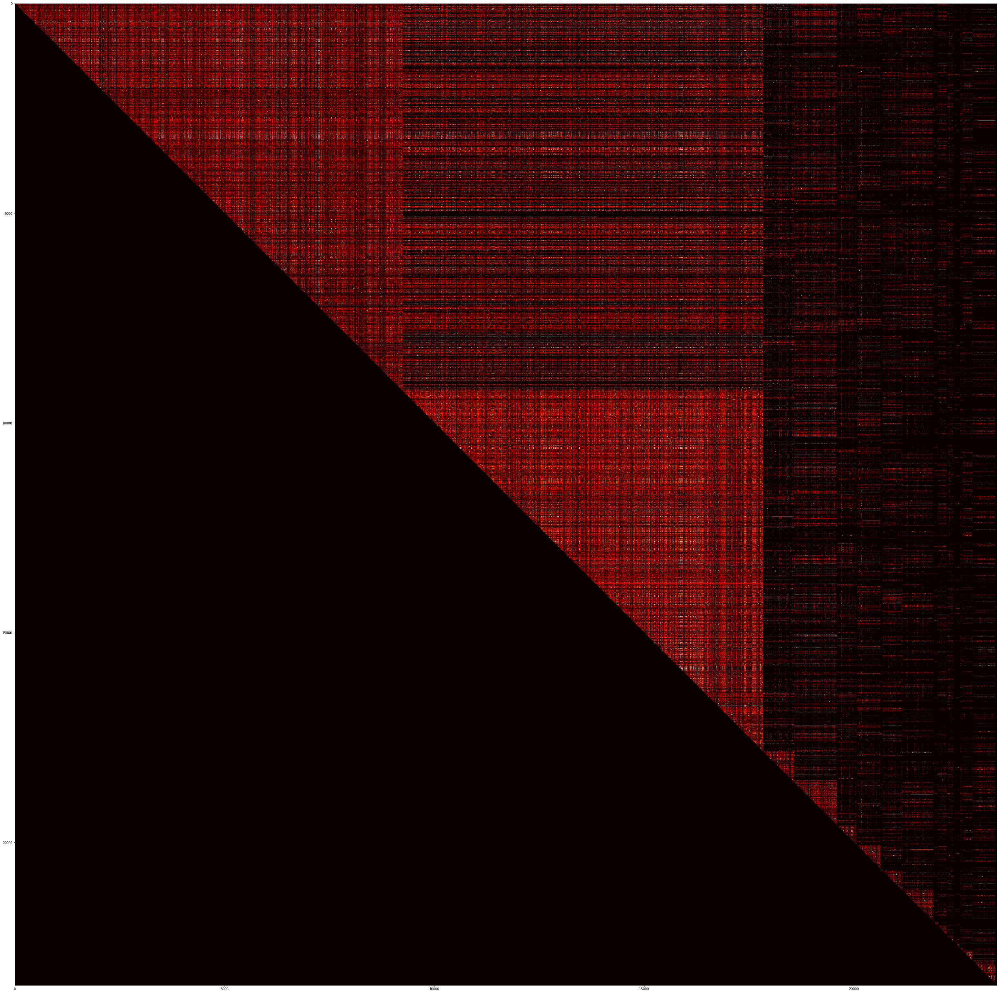

In [142]:
from matplotlib.pyplot import figure
from matplotlib.pyplot import subplots
figure(num=None, figsize=(56, 56), dpi=80, facecolor='w', edgecolor='k')
fig, ax = subplots(figsize=(56, 56))
ax.imshow(ugly, cmap='hot', interpolation='nearest')
plt.savefig("H:/Data/7202019morning.png")

In [141]:
import matplotlib.pyplot as plt
plt.savefig("H:/Data/7202019morning.png")

<Figure size 432x288 with 0 Axes>

In [82]:
'''
This is the function that get the similarities between two arrays
'''
# def get_similarity (array1, array2):
#     pass

# load the saved dictionary
with open("H:/Data/similarity.json", "r", encoding = 'ISO-8859-1') as f:
    jiba2 = json.load(f)
# actually the cosine similirity can be calculated directly by the sklearn pacakage

In [ ]:
def write_json(data, file_name):
    with open(filename, 'w') as f:
        for i in data:
            f.write(i)
            

In [2276]:
def writing_list(data, file_name):
    with open(file_name, 'w') as f:
        for i in data:
            f.write(str(i))
            f.write('\n')
        print('Done')

In [2280]:
writing_list(jiba, "H:/Data/similarity_results.txt")

Done


In [114]:
b = cosine_similarity([ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes0'][0]['Shape'][0], ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes2'][0]['Shape'][0]])[0][1]
print(b)

0.73390144


In [1040]:
for k ,v in ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes0'][0].items():
    mimi = []
    for s_k, s_v in ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes2'][0].items():
        if k in ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes2'][0].keys():
            similarity = cosine_similarity([ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes0'][0][k][0], ceshi['Reebok_Classic_Leather_Gum_Casual_Shoes2'][0][k][0]] )
            mimi.append(similarity)
            avg_smi = np.mean(mimi)
            print(avg_smi)
        

0.86695075


## Draw the heatmap based on the data we got previously

In [103]:
import seaborn as sns; sns.set()
import random
np.random.seed(66)
# xiaodata = np.random.rand(10, 12)
from matplotlib import pyplot as plt

In [85]:
'''
Get random 100000 samples from the jiba2
'''
jiba3 = {}
jiba3 = random.sample(jiba2.items(), 10000)

In [86]:
jiba3[0]

('Adidas_Ultraboost_Running_Shoes1013Adidas_Ultraboost_Running_Shoes1414',
 0.6529750227928162)

In [100]:
'''
好，现在草泥马的老子终于选了10万个数据点出来可以搞一下了，草泥马的
'''
# df = pd.DataFrame(list(jiba3))
print(len(jiba2))
len(sec_dic)

145618279


23403

In [101]:
sim = [[0]*23403 for i in range(23403)]
print(np.shape(sim))

o = 0
name_dict = {}
for k, v in jiba2.items():
    o += 1
    if o % 500 == 0:
        print(o)
    n1,n2= k.split("+")
    if n1 not in name_dict:
        name_dict[n1] = len(name_dict)
    n1_id = name_dict[n1]
#     print(n1_id)
    if n2 not in name_dict:
        name_dict[n2] = len(name_dict)
    n2_id = name_dict[n2]
#     print(n1_id, n2_id)
    sim[n2_id-1][n1_id-1] = v

(23403, 23403)
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000
11500
12000
12500
13000
13500
14000
14500
15000
15500
16000
16500
17000
17500
18000
18500
19000
19500
20000
20500
21000
21500
22000
22500
23000
23500
24000
24500
25000
25500
26000
26500
27000
27500
28000
28500
29000
29500
30000
30500
31000
31500
32000
32500
33000
33500
34000
34500
35000
35500
36000
36500
37000
37500
38000
38500
39000
39500
40000
40500
41000
41500
42000
42500
43000
43500
44000
44500
45000
45500
46000
46500
47000
47500
48000
48500
49000
49500
50000
50500
51000
51500
52000
52500
53000
53500
54000
54500
55000
55500
56000
56500
57000
57500
58000
58500
59000
59500
60000
60500
61000
61500
62000
62500
63000
63500
64000
64500
65000
65500
66000
66500
67000
67500
68000
68500
69000
69500
70000
70500
71000
71500
72000
72500
73000
73500
74000
74500
75000
75500
76000
76500
77000
77500
78000
78500
79000
79500
80000
80500
81000
81500
82000
82500
83000
83500
840

In [123]:
with open("H:/Data/thepicture.json", "w") as f:
    json.dump(sim ,f)
print('Done')

Done


In [104]:
plt.figure(figsize = (46,46))
sns_plot = sns.heatmap(sim, annot=True)

MemoryError: 

Error in callback <function flush_figures at 0x0000027AB734C400> (for post_execute):


KeyboardInterrupt: 

In [2356]:
hangming = []
for i in jiba3:
    hangming.append(i[0])

In [2357]:
df.index = pd.Series(hangming)

In [87]:
xuanlie = []
for i in sec_dic.keys():
    xuanlie.append(i)

In [88]:
xuanlie = random.sample(xuanlie, 500)

In [99]:
xuanlie

['Nike_Air_Max_Speed_Turf_Training_Shoes0',
 'Adidas_Nmd_R1_Stlt_Primeknit_Casual_Shoes314',
 'Nike_Air_Force_1_Low_Casual_Shoes132',
 'Nike_Air_Force_1_Low_Casual_Shoes34',
 'Adidas_Ultraboost_Running_Shoes2654',
 'Air_Jordan_Retro_1_Low_Basketball_Shoes17',
 'Adidas_Originals_Stan_Smith_Casual_Shoes409',
 'Adidas_Ultraboost_Running_Shoes3599',
 'Adidas_Nmd_Runner_R1_Casual_Shoes1543',
 'Air_Jordan_Retro_6_Basketball_Shoes274',
 'Adidas_Stan_Smith_Vulc_Casual_Shoes254',
 'Adidas_Nmd_R1_Stlt_Primeknit_Casual_Shoes56',
 'Adidas_Nmd_Runner_R1_Casual_Shoes810',
 'Adidas_Ultraboost_Running_Shoes3324',
 'Adidas_Originals_Stan_Smith_Casual_Shoes676',
 'Adidas_Stan_Smith_Vulc_Casual_Shoes440',
 'Adidas_Ultraboost_Running_Shoes343',
 'Adidas_Nmd_Runner_R1_Casual_Shoes2466',
 'Adidas_Ultraboost_Mid_Running_Shoes522',
 'Adidas_Ultraboost_Mid_Running_Shoes1179',
 'Adidas_Stan_Smith_Vulc_Casual_Shoes217',
 'Adidas_Nmd_Runner_R1_Casual_Shoes373',
 'Adidas_Stan_Smith_Vulc_Casual_Shoes572',
 'Adidas_

In [103]:
def create_newframe(liebiao, shuzhi):
    chunksize = 300
    tmp = []
    tmp2 = pd.DataFrame()
    o = 0
    result2 = pd.DataFrame()
    for i in liebiao[0:5]: # the randomly picked 10000 samples of customer
        print(o)
        o += 1
        for j in shuzhi: # the randomly picked 100000 samples of similarities
            if i in j[0]:
                tmp.append(j[1])
            result2 = pd.concat([result2, pd.DataFrame({i:tmp})], sort = False)
#         result2 = pd.concat([result2, result], sort = False)
    return result2

In [104]:
result2 = create_newframe(xuanlie, jiba3) 

0
1
2
3
4


In [105]:
result2

,Nike_Air_Max_Speed_Turf_Training_Shoes0,Adidas_Nmd_R1_Stlt_Primeknit_Casual_Shoes314,Nike_Air_Force_1_Low_Casual_Shoes132,Nike_Air_Force_1_Low_Casual_Shoes34,Adidas_Ultraboost_Running_Shoes2654
0,0.719061,NaN,NaN,NaN,NaN
0,0.719061,NaN,NaN,NaN,NaN
0,0.719061,NaN,NaN,NaN,NaN
0,0.719061,NaN,NaN,NaN,NaN
0,0.719061,NaN,NaN,NaN,NaN
0,0.719061,NaN,NaN,NaN,NaN
0,0.719061,NaN,NaN,NaN,NaN
0,0.719061,NaN,NaN,NaN,NaN
0,0.719061,NaN,NaN,NaN,NaN
0,0.719061,NaN,NaN,NaN,NaN


In [106]:
import matplotlib.pyplot as plt

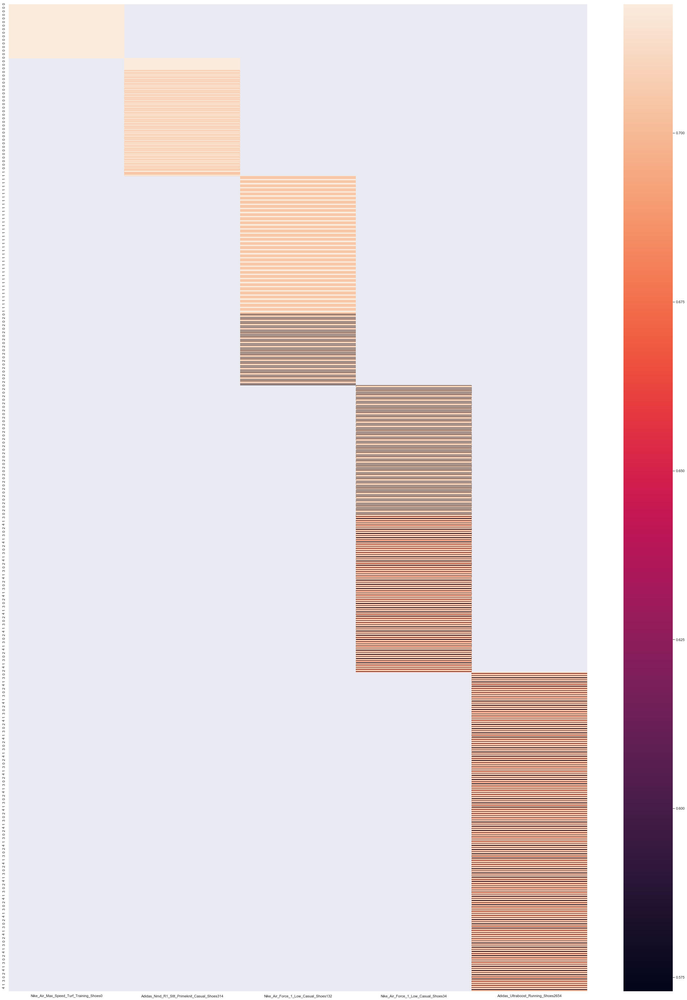

In [107]:
plt.figure(figsize=(40, 56))
ax = sns.heatmap(result2)

In [97]:
result2

,Nike_Air_Max_Speed_Turf_Training_Shoes0,Adidas_Nmd_R1_Stlt_Primeknit_Casual_Shoes314,Nike_Air_Force_1_Low_Casual_Shoes132,Nike_Air_Force_1_Low_Casual_Shoes34,Adidas_Ultraboost_Running_Shoes2654,Air_Jordan_Retro_1_Low_Basketball_Shoes17,Adidas_Originals_Stan_Smith_Casual_Shoes409,Adidas_Ultraboost_Running_Shoes3599,Adidas_Nmd_Runner_R1_Casual_Shoes1543,Air_Jordan_Retro_6_Basketball_Shoes274,...,Adidas_Ultraboost_Mid_Running_Shoes3321,Adidas_Nmd_Runner_R1_Casual_Shoes607,Adidas_Ultraboost_Running_Shoes446,Adidas_Ultraboost_Running_Shoes2522,Nike_Air_Huarache_Run_Ultra_Casual_Shoes5,Air_Jordan_6_Rings_Basketball_Shoes20,Adidas_Ultraboost_Running_Shoes2067,Adidas_Adilette_Slide_Sandals4,Adidas_Ultraboost_Mid_Running_Shoes1739,Adidas_Originals_Eqt_Support_Mid_Adv_Casual_Shoes45
0,0.719061,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,0.719061,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,0.705134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,0.705118,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,0.719061,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,0.705134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,0.705118,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,0.572927,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,0.719061,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,0.705134,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
